In [1]:
cd ..

m:\OneDrive\Projects\federated_imputation


In [162]:
from src.modules.data_preprocessing import load_data
from src.modules.data_spliting import split_train_test
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer, KNNImputer
from sklearn.decomposition import PCA
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score
from sklearn.inspection import DecisionBoundaryDisplay
from src.missing_data_exploration.sub_modules.ms_simulate import mcar_simulate, mar_simulate
import numpy as np
from matplotlib.colors import ListedColormap
import warnings
warnings.filterwarnings("ignore")

## Code and Visualization

In [135]:
# function to plot 2d mapping of data
def plots_2d_scatter(data_list, clfs, train_mesh, test_mesh, missing_ratios, size = 7, eps = 0.5):
    cm = plt.cm.RdBu
    fig, axes = plt.subplots(2, len(missing_ratios), figsize = (15, 5), squeeze=False, sharey=True, sharex=True)
    coord_list = [entry.ravel() for entry in train_mesh]
    train_mesh = np.vstack(coord_list).T
    coord_list = [entry.ravel() for entry in test_mesh]
    test_mesh = np.vstack(coord_list).T
    for i in range(len(missing_ratios)):
        X_train,y_train, X_test, y_test = data_list[i]
        # decision boundary
        clf = clfs[i]
        DecisionBoundaryDisplay.from_estimator(
            clf, train_mesh, response_method = 'predict', ax = axes[0][i], cmap=cm, alpha=0.8, eps=eps)
        DecisionBoundaryDisplay.from_estimator(
            clf, test_mesh, response_method = 'predict', ax = axes[1][i], cmap=cm, alpha=0.8, eps=eps)    
        axes[0][i].scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolors="k")
        axes[1][i].scatter(X_test[:, 0], X_test[:, 1], c=y_test, edgecolors="k")
        axes[0, i].set_title("ms {}".format(missing_ratios[i]))
        axes[0, i].legend([],[], frameon=False)
        axes[1, i].legend([],[], frameon=False)
    axes[0, 0].set_ylabel("train x1")
    axes[1, 0].set_ylabel("test x1")
    plt.show()

In [232]:
def calculate_2d_mapping(
        X_train, y_train, X_test, y_test, missing_ratios, clf, 
        mechanism='mcar', imp_method = 'simple', seed = 42, eps = 0.5, ms_func = None, cols = [1]
    ):
    
    data,clfs = [],[]
    for i in range(len(missing_ratios)):
        if missing_ratios[i] != 0:
            # add missing data
            if mechanism == 'mcar':
                X_train_ms = mcar_simulate.simulate_nan_mcar(
                    X_train, np.arange(X_train.shape[1]), missing_ratios[i], seed)
            elif mechanism == 'mar_quantile_strict':
                X_train_ms = mar_simulate.simulate_nan_mar_quantile(
                    X_train, cols, missing_ratios[i], ms_func, obs=True, strict = True, seed = seed)
            elif mechanism == 'mar_sigmoid_nonstrict':
                X_train_ms = mar_simulate.simulate_nan_mar_sigmoid(
                    X_train, cols, missing_ratios[i], ms_func, obs=True, k = 'all', strict = False, seed = seed)
            elif mechanism == 'mary_quantile_strict':
                cols = [0,1]
                X_train_ms = mar_simulate.simulate_nan_mary_quantile(
                    X_train, cols, missing_ratios[i], ms_func, strict = True, seed = seed)
            elif mechanism == 'mary_sigmoid_nonstrict':
                cols = [0,1]
                X_train_ms = mar_simulate.simulate_nan_mary_sigmoid(
                    X_train, cols, missing_ratios[i], ms_func, strict = False, seed = seed)
            
            # imputation
            if imp_method == 'iterative':
                max_values = np.nanmax(X_train_ms, axis=0) + 0.00001
                min_values = np.nanmin(X_train_ms, axis=0)
                imp = IterativeImputer(max_iter=10, random_state=seed, max_value=max_values, min_value=min_values)
            elif imp_method == 'simple':
                imp = SimpleImputer(missing_values=np.nan, strategy='mean')
            elif imp_method == 'knn':
                imp = KNNImputer(n_neighbors=5)
            else:
                raise ValueError("Unknown imputation method")
            imp.fit(X_train_ms)
            X_train = imp.transform(X_train_ms)
        
        data.append((X_train, y_train, X_test, y_test))

        

        # decision boundary
        # classification decision boundary
        if clf == 'logistic':
            clf_ = LogisticRegression(random_state=seed, max_iter=1000)
            param_grid = {'C': [0.1, 1, 10, 100, 1000]}
            grid = GridSearchCV(clf_, param_grid, cv=5)
        elif clf == 'svm':
            clf_ = SVC(kernel='rbf', random_state=seed)
            param_grid = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001]}
            grid = GridSearchCV(clf_, param_grid, cv=5)
        else:
            raise ValueError("Unknown classifier")
        
        grid.fit(X_train, y_train)
        clf_ = grid.best_estimator_
        y_pred = clf_.predict(X_test)
        clfs.append(clf_)
        print("MR: {} Accuracy: {}".format(missing_ratios[i], accuracy_score(y_test, y_pred)))
    
    x1_train_min, x1_train_max = np.inf, -np.inf
    x2_train_min, x2_train_max = np.inf, -np.inf
    x1_test_min, x1_test_max = np.inf, -np.inf
    x2_test_min, x2_test_max = np.inf, -np.inf
    for i in range(len(missing_ratios)):
        X_train, y_train, X_test, y_test = data[i]
        x1_train_max = max(x1_train_max, X_train[:, 0].max())
        x1_train_min = min(x1_train_min, X_train[:, 0].min())
        x2_train_max = max(x2_train_max, X_train[:, 1].max())
        x2_train_min = min(x2_train_min, X_train[:, 1].min())
        x1_test_max = max(x1_test_max, X_test[:, 0].max())
        x1_test_min = min(x1_test_min, X_test[:, 0].min())
        x2_test_max = max(x2_test_max, X_test[:, 1].max())
        x2_test_min = min(x2_test_min, X_test[:, 1].min())
    
    h = .05  # step size in the mesh
    train_mesh = np.meshgrid(np.arange(x1_train_min, x1_train_max, h), np.arange(x2_train_min, x2_train_max, h))
    test_mesh = np.meshgrid(np.arange(x1_test_min, x1_test_max, h), np.arange(x2_test_min, x2_test_max, h))


    plots_2d_scatter(data, clfs, train_mesh, test_mesh, missing_ratios, size = 7, eps = eps)
        
    return data, clfs

## Iris

In [227]:
data, config = load_data('iris')
train_test_sets = split_train_test(data, n_folds = 5, seed = 42)
print(len(train_test_sets))
train_data, test_data = train_test_sets[0]
print(train_data.shape, test_data.shape)
features = train_data.columns[2:4]
target = config['target']
X_train = train_data[features].values
y_train = train_data[target].values
X_test = test_data[features].values
y_test = test_data[target].values
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

5
(120, 5) (30, 5)
(120, 2) (120,) (30, 2) (30,)


### MCAR

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 0.9333333333333333
MR: 0.3 Accuracy: 0.9
MR: 0.5 Accuracy: 0.9
MR: 0.7 Accuracy: 0.8333333333333334
MR: 0.9 Accuracy: 0.7666666666666667
(400, 2)


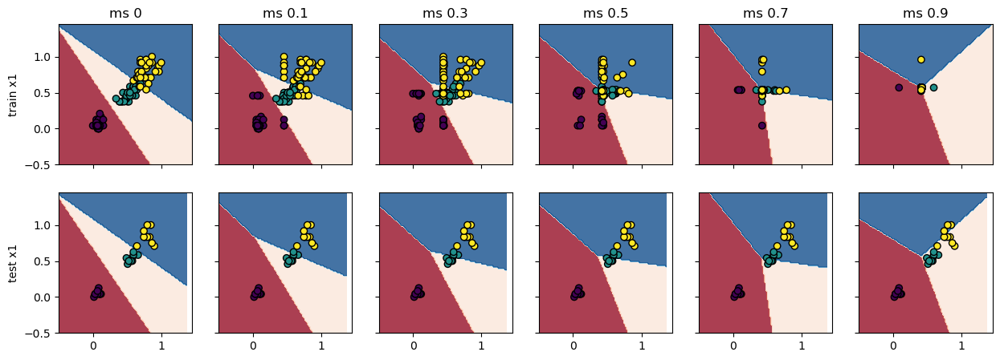

In [132]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mcar', 'simple', 42
)

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 1.0
MR: 0.5 Accuracy: 0.9666666666666667
MR: 0.7 Accuracy: 1.0
MR: 0.9 Accuracy: 0.43333333333333335


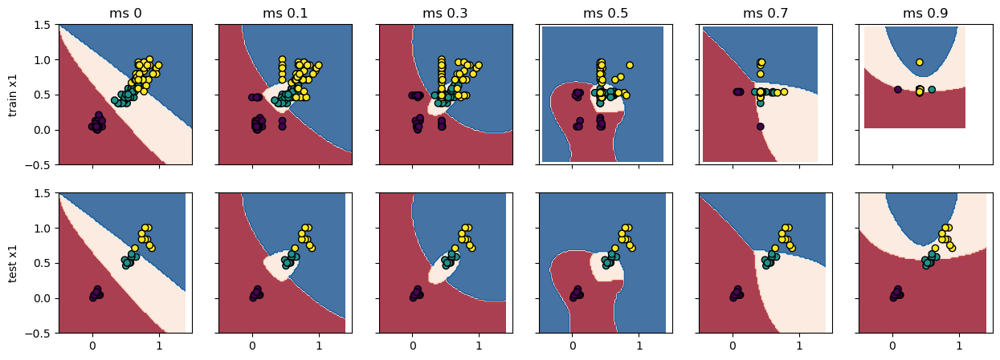

In [65]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'simple', 42
)

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 1.0
MR: 0.5 Accuracy: 0.9
MR: 0.7 Accuracy: 0.7
MR: 0.9 Accuracy: 0.6666666666666666


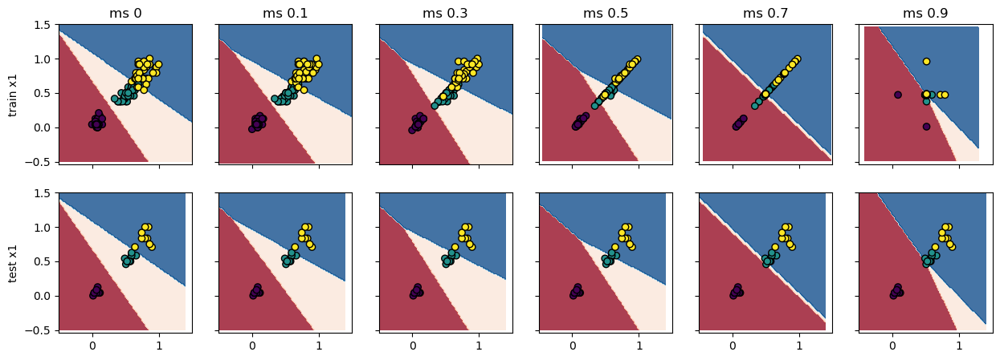

In [66]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mcar', 'iterative', 42
)

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 0.9666666666666667
MR: 0.3 Accuracy: 1.0
MR: 0.5 Accuracy: 1.0
MR: 0.7 Accuracy: 1.0
MR: 0.9 Accuracy: 0.9


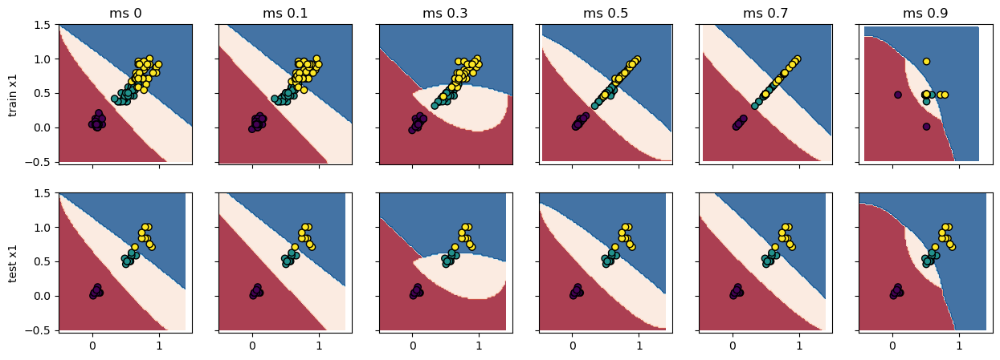

In [67]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'iterative', 42
)

### MAR

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 1.0
MR: 0.5 Accuracy: 0.9333333333333333
MR: 0.7 Accuracy: 0.9333333333333333
MR: 0.9 Accuracy: 0.9333333333333333


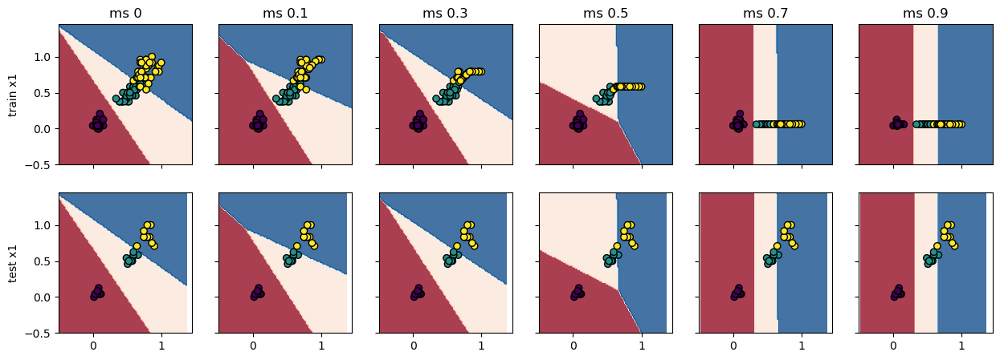

In [230]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mar_quantile_strict', 
    'iterative', 46, ms_func ='right', cols=[1]
)

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 1.0
MR: 0.5 Accuracy: 0.9666666666666667
MR: 0.7 Accuracy: 0.9333333333333333
MR: 0.9 Accuracy: 0.9666666666666667


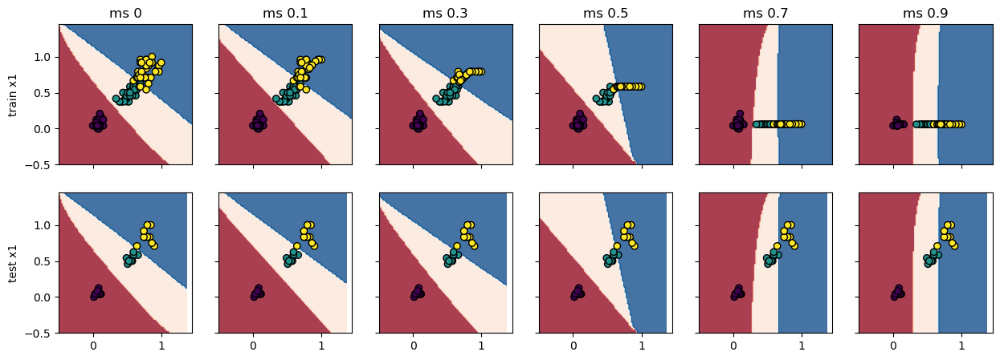

In [229]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='right', cols = [1]
)

### MARY

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 0.6666666666666666
MR: 0.5 Accuracy: 0.6666666666666666
MR: 0.7 Accuracy: 0.43333333333333335
MR: 0.9 Accuracy: 0.3333333333333333


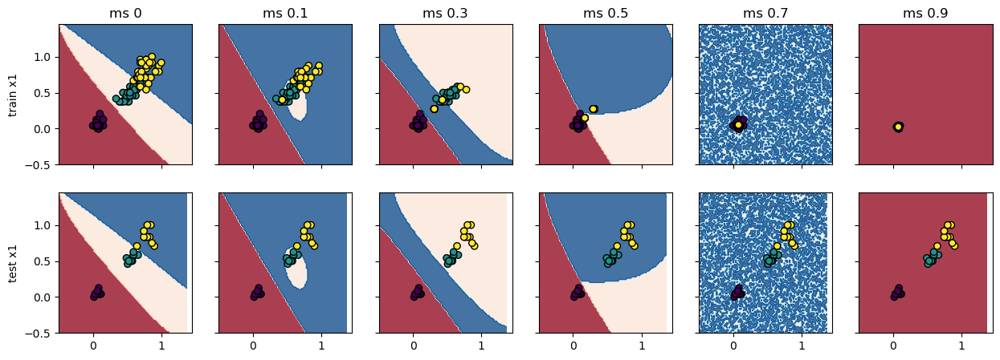

In [233]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='right'
)

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 0.9333333333333333
MR: 0.5 Accuracy: 0.3
MR: 0.7 Accuracy: 0.13333333333333333
MR: 0.9 Accuracy: 0.1


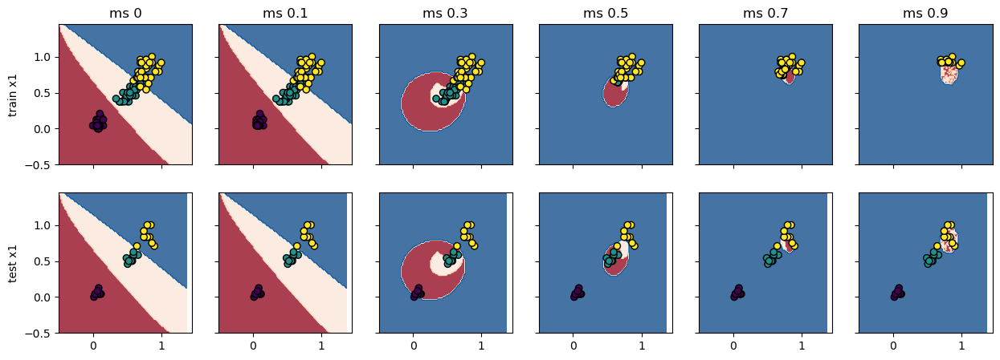

In [234]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='left'
)

## Telugu

In [235]:
data, config = load_data('telugu_tabular')
train_test_sets = split_train_test(data, n_folds = 5, seed = 42)
print(len(train_test_sets))
train_data, test_data = train_test_sets[0]
print(train_data.shape, test_data.shape)
features = train_data.columns[0:2]
target = config['target']
X_train = train_data[features].values
y_train = train_data[target].values
X_test = test_data[features].values
y_test = test_data[target].values
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

5
(696, 4) (175, 4)
(696, 2) (696,) (175, 2) (175,)


### MCAR

MR: 0 Accuracy: 0.84
MR: 0.1 Accuracy: 0.7828571428571428
MR: 0.3 Accuracy: 0.7428571428571429
MR: 0.5 Accuracy: 0.72
MR: 0.7 Accuracy: 0.6971428571428572
MR: 0.9 Accuracy: 0.49714285714285716


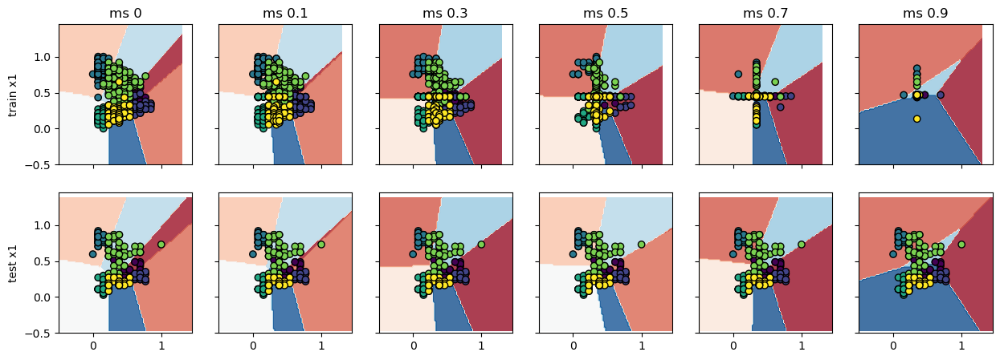

In [177]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mcar', 'simple', 42
)

MR: 0 Accuracy: 0.8628571428571429
MR: 0.1 Accuracy: 0.8171428571428572
MR: 0.3 Accuracy: 0.7714285714285715
MR: 0.5 Accuracy: 0.7371428571428571
MR: 0.7 Accuracy: 0.7142857142857143
MR: 0.9 Accuracy: 0.5771428571428572


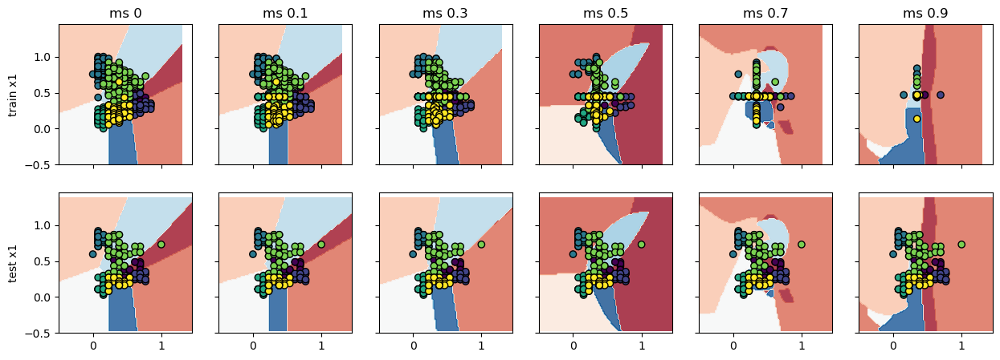

In [178]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'simple', 42
)

MR: 0 Accuracy: 0.84
MR: 0.1 Accuracy: 0.7942857142857143
MR: 0.3 Accuracy: 0.76
MR: 0.5 Accuracy: 0.6971428571428572
MR: 0.7 Accuracy: 0.6457142857142857
MR: 0.9 Accuracy: 0.5028571428571429


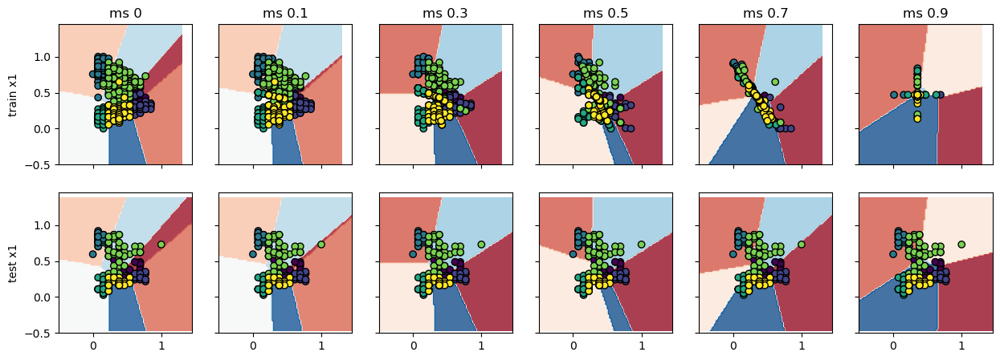

In [179]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mcar', 'iterative', 42
)

MR: 0 Accuracy: 0.8628571428571429
MR: 0.1 Accuracy: 0.8285714285714286
MR: 0.3 Accuracy: 0.7771428571428571
MR: 0.5 Accuracy: 0.8228571428571428
MR: 0.7 Accuracy: 0.7771428571428571
MR: 0.9 Accuracy: 0.5371428571428571


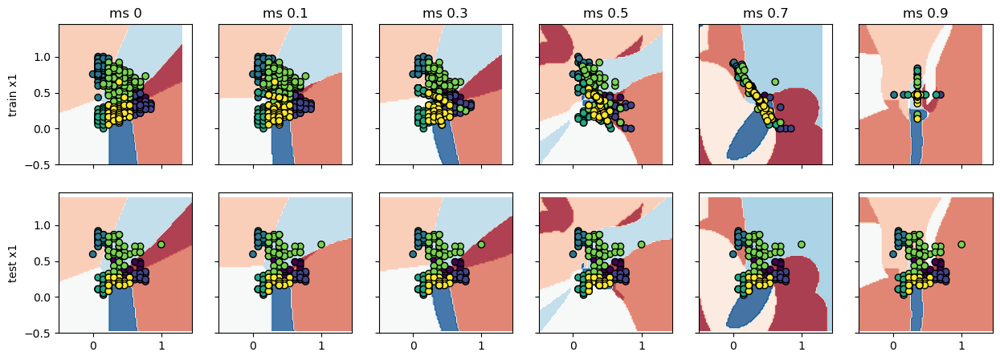

In [180]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'iterative', 42
)

### MAR

MR: 0 Accuracy: 0.8628571428571429
MR: 0.1 Accuracy: 0.8514285714285714
MR: 0.3 Accuracy: 0.76
MR: 0.5 Accuracy: 0.6457142857142857
MR: 0.7 Accuracy: 0.45714285714285713
MR: 0.9 Accuracy: 0.52


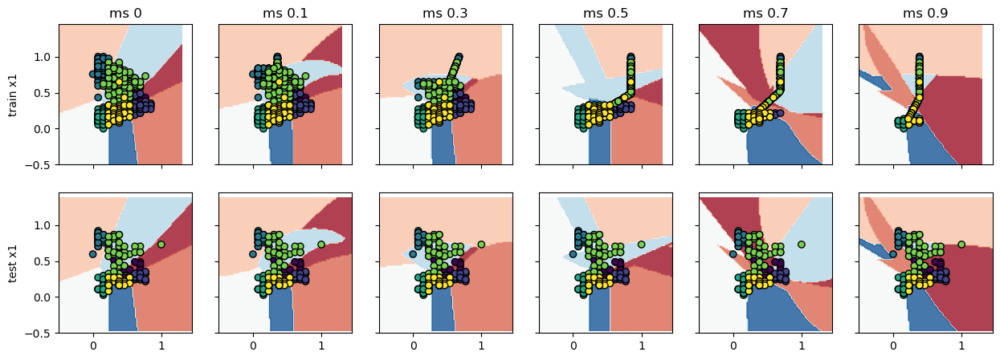

In [196]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='right'
)

MR: 0 Accuracy: 0.8628571428571429
MR: 0.1 Accuracy: 0.8857142857142857
MR: 0.3 Accuracy: 0.7942857142857143
MR: 0.5 Accuracy: 0.64
MR: 0.7 Accuracy: 0.4685714285714286
MR: 0.9 Accuracy: 0.72


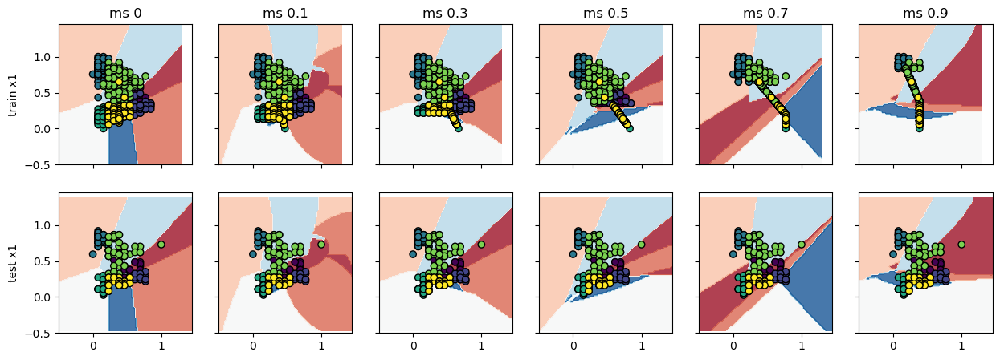

In [197]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='left'
)

### MARY

MR: 0 Accuracy: 0.8628571428571429
MR: 0.1 Accuracy: 0.8114285714285714
MR: 0.3 Accuracy: 0.7714285714285715
MR: 0.5 Accuracy: 0.6228571428571429
MR: 0.7 Accuracy: 0.5257142857142857
MR: 0.9 Accuracy: 0.4


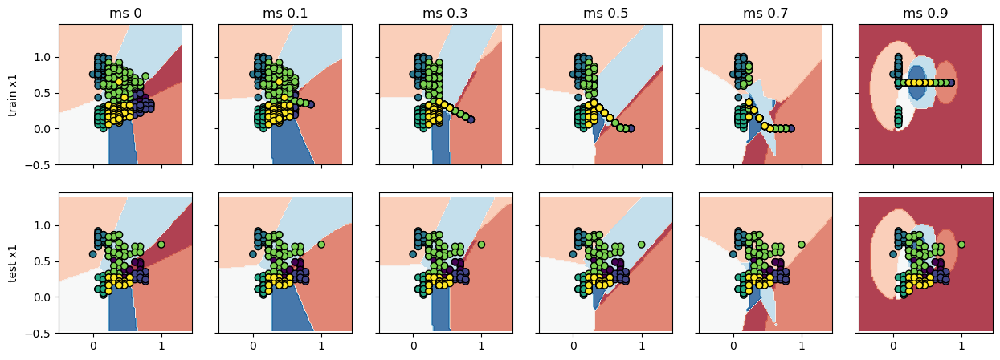

In [236]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='right'
)

## Gaussian

In [80]:
from sklearn.datasets import make_blobs, make_circles, make_moons, make_classification, make_gaussian_quantiles, make_hastie_10_2
from sklearn.datasets import make_friedman1, make_friedman2, make_friedman3
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

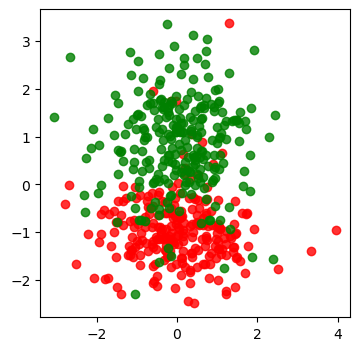

(400, 2) (400,) (100, 2) (100,)


In [237]:
X, y = make_classification(
    n_samples=500, n_features=2, n_redundant=0, n_informative=1, random_state=1, flip_y=0.1,
    class_sep = 1, n_clusters_per_class=1) 

red = y == 0
green = y == 1
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(X[red, 0], X[red, 1], c="r", marker='o', alpha = 0.8)
ax.scatter(X[green, 0], X[green, 1], c="g", marker='o', alpha = 0.8)
plt.axis("tight")
plt.show()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

### MCAR

MR: 0 Accuracy: 0.86
MR: 0.1 Accuracy: 0.88
MR: 0.3 Accuracy: 0.87
MR: 0.5 Accuracy: 0.87
MR: 0.7 Accuracy: 0.8
MR: 0.9 Accuracy: 0.81


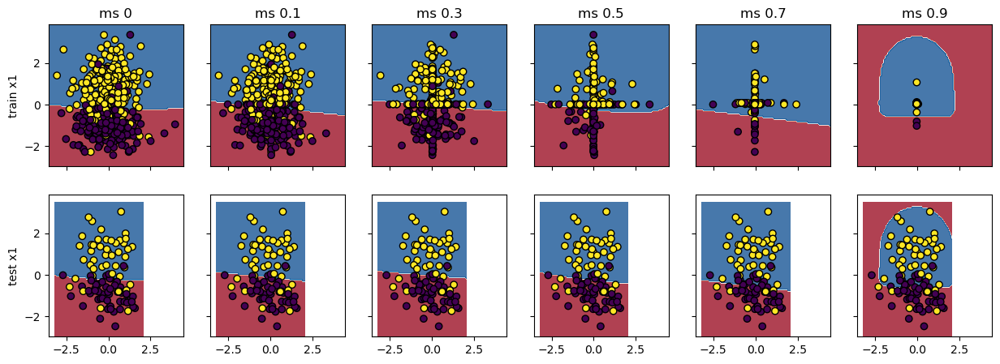

In [141]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'simple', 42, eps=0.5
)

MR: 0 Accuracy: 0.86
MR: 0.1 Accuracy: 0.87
MR: 0.3 Accuracy: 0.86
MR: 0.5 Accuracy: 0.85
MR: 0.7 Accuracy: 0.87
MR: 0.9 Accuracy: 0.72


d:\E\miniconda\lib\site-packages\sklearn\impute\_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


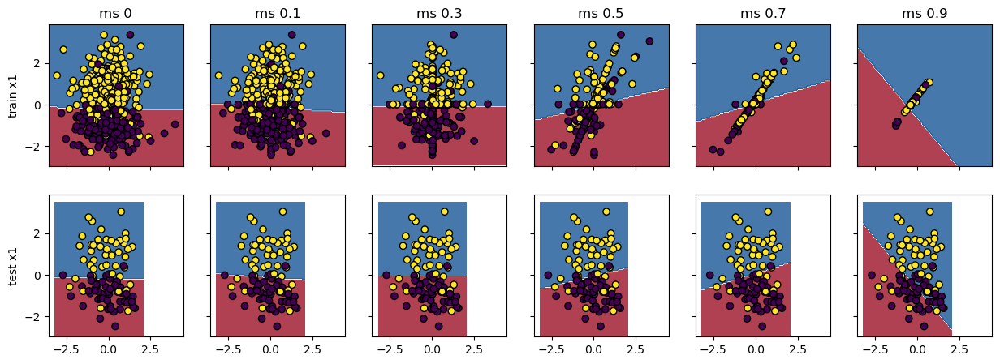

In [142]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mcar', 'iterative', 42, eps=0.5
)

### MAR

MR: 0 Accuracy: 0.86
MR: 0.1 Accuracy: 0.87
MR: 0.3 Accuracy: 0.88
MR: 0.5 Accuracy: 0.89
MR: 0.7 Accuracy: 0.88
MR: 0.9 Accuracy: 0.87


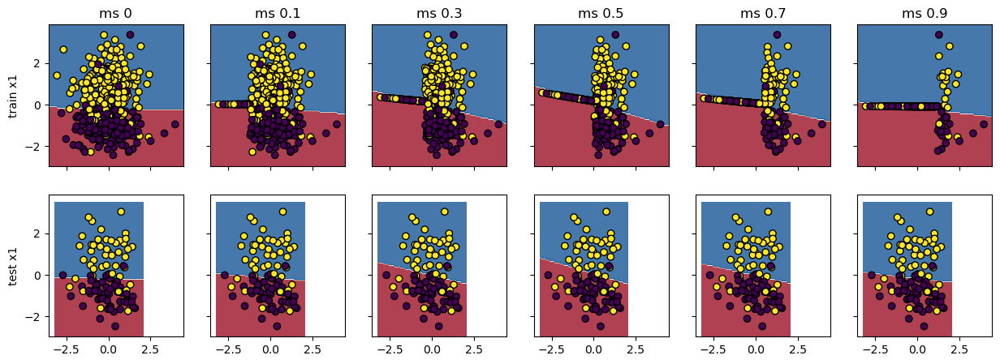

In [203]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='left', cols = [1]
)

MR: 0 Accuracy: 0.86
MR: 0.1 Accuracy: 0.87
MR: 0.3 Accuracy: 0.84
MR: 0.5 Accuracy: 0.84
MR: 0.7 Accuracy: 0.74
MR: 0.9 Accuracy: 0.62


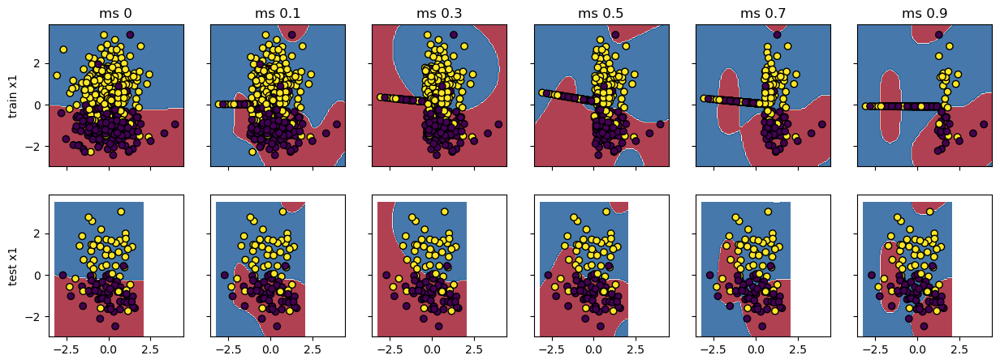

In [204]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='left', cols = [1]
)

MR: 0 Accuracy: 0.86
MR: 0.1 Accuracy: 0.86
MR: 0.3 Accuracy: 0.86
MR: 0.5 Accuracy: 0.89
MR: 0.7 Accuracy: 0.86
MR: 0.9 Accuracy: 0.87


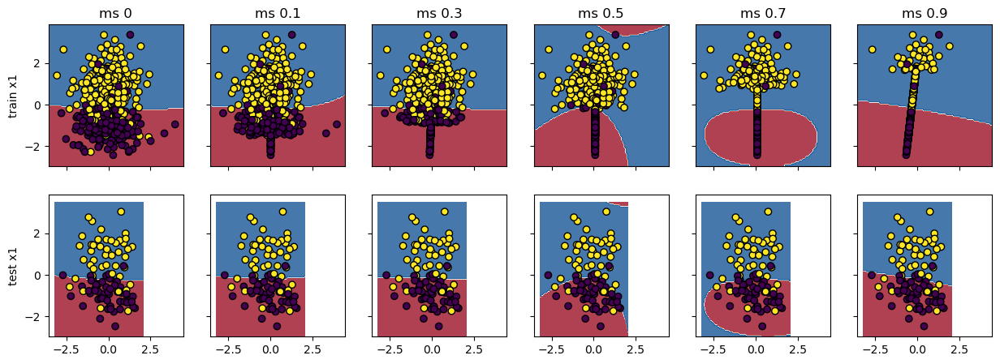

In [206]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='left', cols = [0]
)

### MARY

MR: 0 Accuracy: 0.86
MR: 0.1 Accuracy: 0.85
MR: 0.3 Accuracy: 0.58
MR: 0.5 Accuracy: 0.54
MR: 0.7 Accuracy: 0.51
MR: 0.9 Accuracy: 0.54


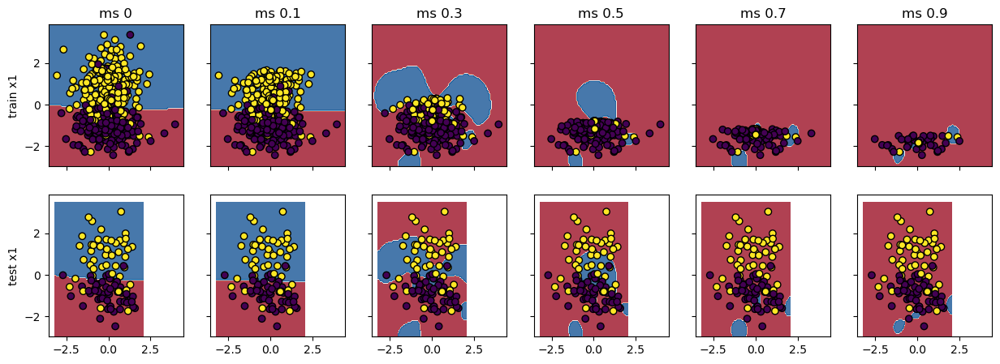

In [240]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='right'
)

MR: 0 Accuracy: 0.86
MR: 0.1 Accuracy: 0.86
MR: 0.3 Accuracy: 0.65
MR: 0.5 Accuracy: 0.42
MR: 0.7 Accuracy: 0.44
MR: 0.9 Accuracy: 0.46


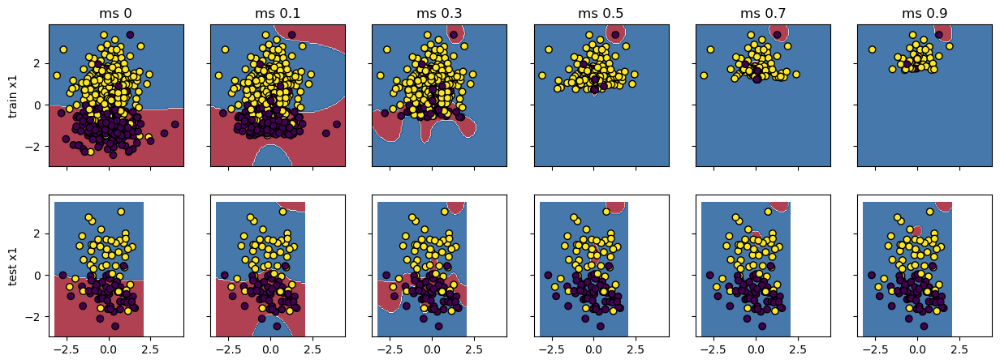

In [241]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='left'
)

## Circle

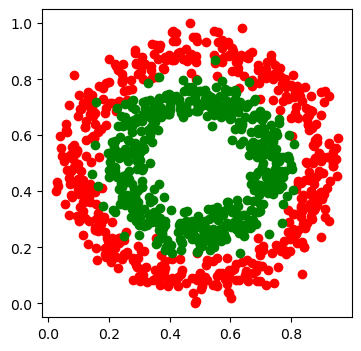

(800, 2) (800,) (200, 2) (200,)


In [242]:
X, y = make_circles(n_samples=1000, shuffle=True, noise=0.1, random_state=None, factor=0.6)
data = np.concatenate((X, y.reshape(-1, 1)), axis=1)
data = pd.DataFrame(data)
X = (X - X.min())/(X.max() - X.min())
red = y == 0
green = y == 1
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(X[red, 0], X[red, 1], c="r")
ax.scatter(X[green, 0], X[green, 1], c="g")
plt.axis("tight")
plt.show()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

### MCAR

MR: 0 Accuracy: 0.385
MR: 0.1 Accuracy: 0.415
MR: 0.3 Accuracy: 0.325
MR: 0.5 Accuracy: 0.42
MR: 0.7 Accuracy: 0.4
MR: 0.9 Accuracy: 0.455


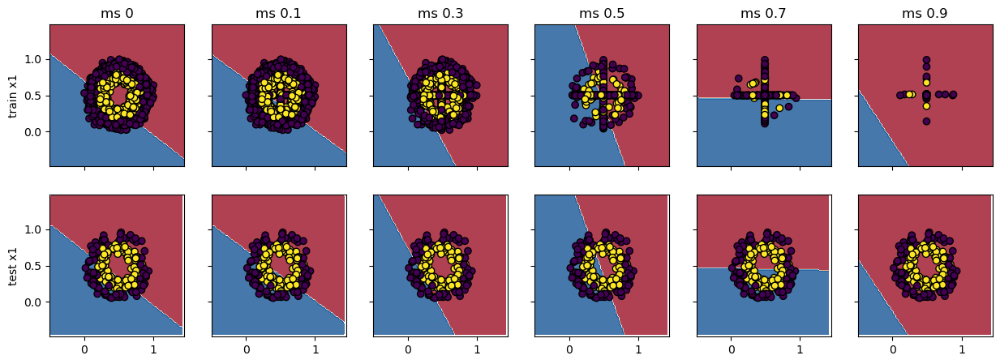

In [144]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mcar', 'simple', 42
)

MR: 0 Accuracy: 0.96
MR: 0.1 Accuracy: 0.965
MR: 0.3 Accuracy: 0.96
MR: 0.5 Accuracy: 0.93
MR: 0.7 Accuracy: 0.65
MR: 0.9 Accuracy: 0.455


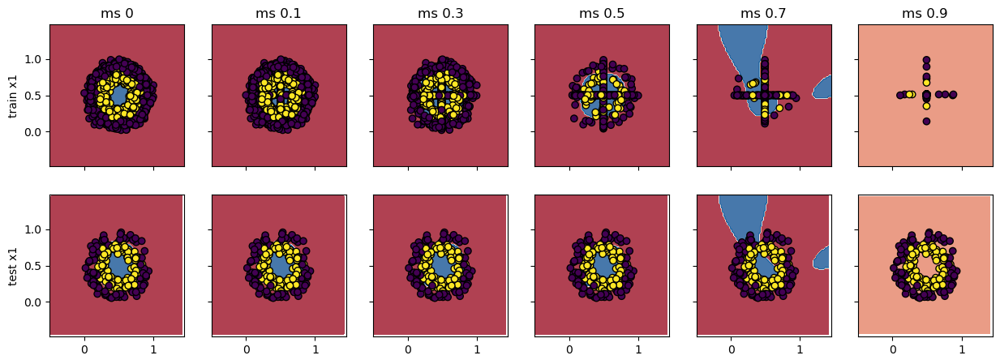

In [145]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'simple', 42
)

MR: 0 Accuracy: 0.385
MR: 0.1 Accuracy: 0.415
MR: 0.3 Accuracy: 0.325
MR: 0.5 Accuracy: 0.42
MR: 0.7 Accuracy: 0.425


d:\E\miniconda\lib\site-packages\sklearn\impute\_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


MR: 0.9 Accuracy: 0.455


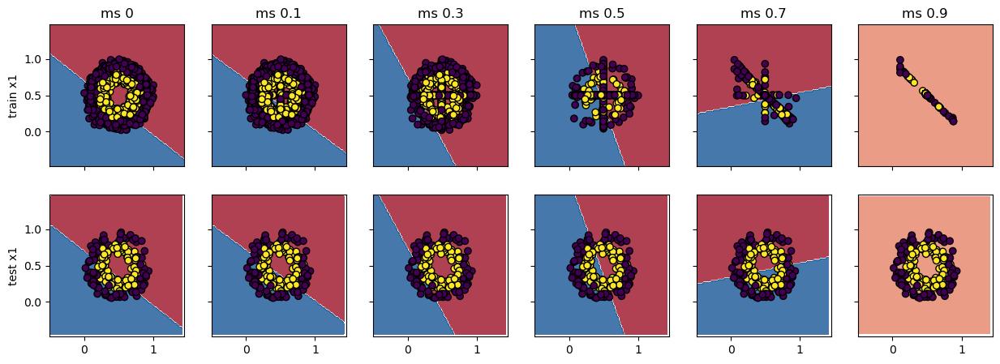

In [146]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mcar', 'iterative', 42
)

MR: 0 Accuracy: 0.96
MR: 0.1 Accuracy: 0.965
MR: 0.3 Accuracy: 0.96
MR: 0.5 Accuracy: 0.88
MR: 0.7 Accuracy: 0.715


d:\E\miniconda\lib\site-packages\sklearn\impute\_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


MR: 0.9 Accuracy: 0.455


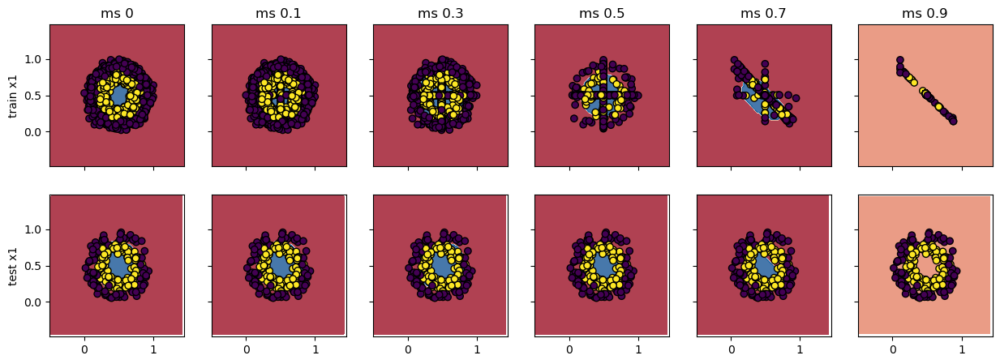

In [147]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'iterative', 42
)

### MAR

MR: 0 Accuracy: 0.955
MR: 0.1 Accuracy: 0.955
MR: 0.3 Accuracy: 0.955
MR: 0.5 Accuracy: 0.94
MR: 0.7 Accuracy: 0.88
MR: 0.9 Accuracy: 0.905


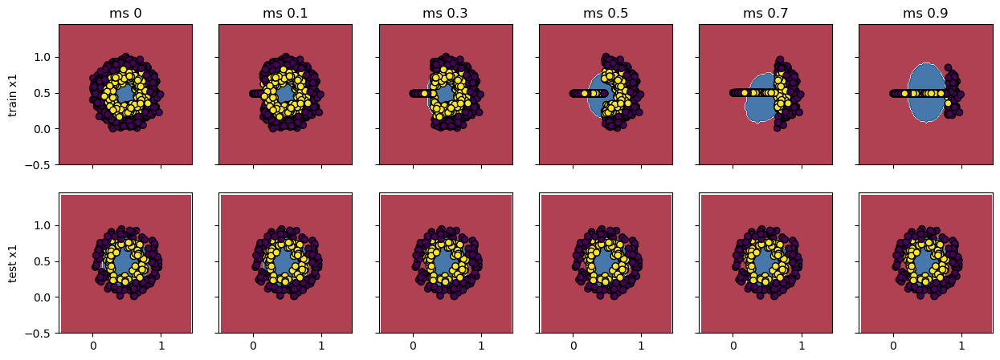

In [208]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='left', cols = [1]
)

### MARY

MR: 0 Accuracy: 0.985
MR: 0.1 Accuracy: 0.94
MR: 0.3 Accuracy: 0.755
MR: 0.5 Accuracy: 0.7
MR: 0.7 Accuracy: 0.56
MR: 0.9 Accuracy: 0.48


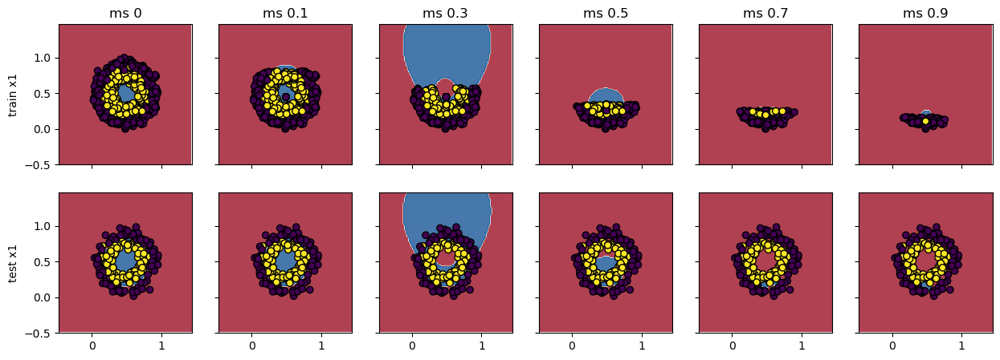

In [243]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='right'
)

## Moon

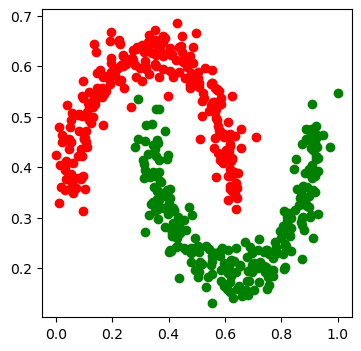

(400, 2) (400,) (100, 2) (100,)


In [247]:
X, y = make_moons(n_samples=500, shuffle=True, noise=0.1, random_state=None)
X = (X - X.min())/(X.max() - X.min())
data = np.concatenate((X, y.reshape(-1, 1)), axis=1)
data = pd.DataFrame(data)
red = y == 0
green = y == 1
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(X[red, 0], X[red, 1], c="r")
ax.scatter(X[green, 0], X[green, 1], c="g")
plt.axis("tight")
plt.show()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

### MCAR

MR: 0 Accuracy: 0.9
MR: 0.1 Accuracy: 0.9
MR: 0.3 Accuracy: 0.88
MR: 0.5 Accuracy: 0.78
MR: 0.7 Accuracy: 0.82
MR: 0.9 Accuracy: 0.9


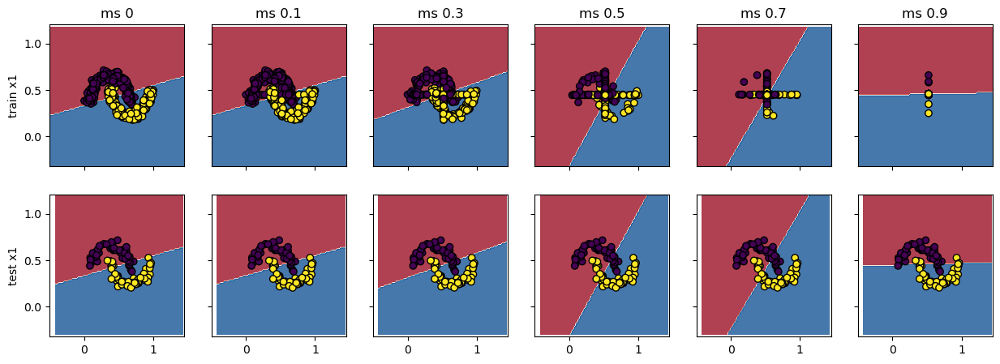

In [149]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mcar', 'simple', 42
)

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 1.0
MR: 0.5 Accuracy: 0.93
MR: 0.7 Accuracy: 0.9
MR: 0.9 Accuracy: 0.88


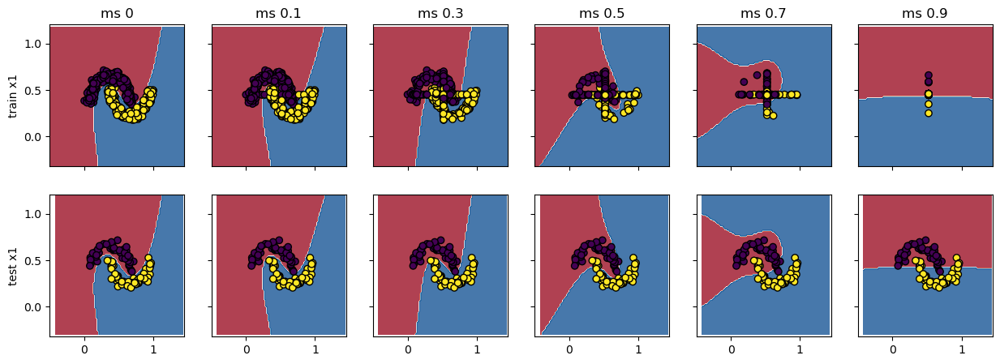

In [150]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'simple', 42
)

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 0.99
MR: 0.5 Accuracy: 0.91
MR: 0.7 Accuracy: 0.78
MR: 0.9 Accuracy: 0.88


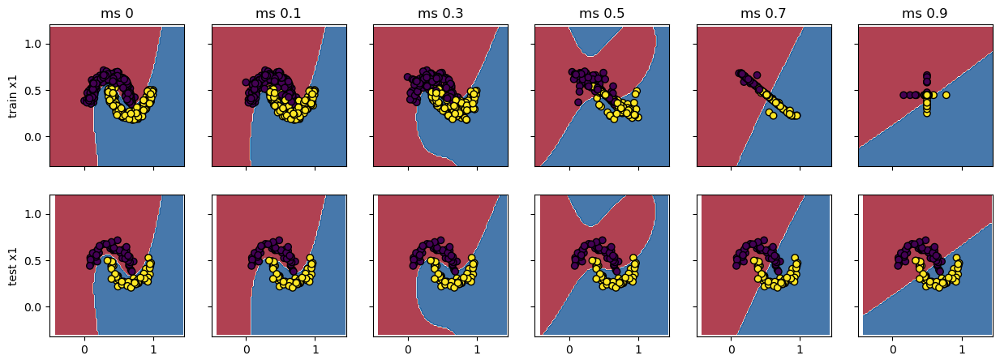

In [151]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'iterative', 42
)

### MAR

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 1.0
MR: 0.5 Accuracy: 0.99
MR: 0.7 Accuracy: 0.88
MR: 0.9 Accuracy: 0.85


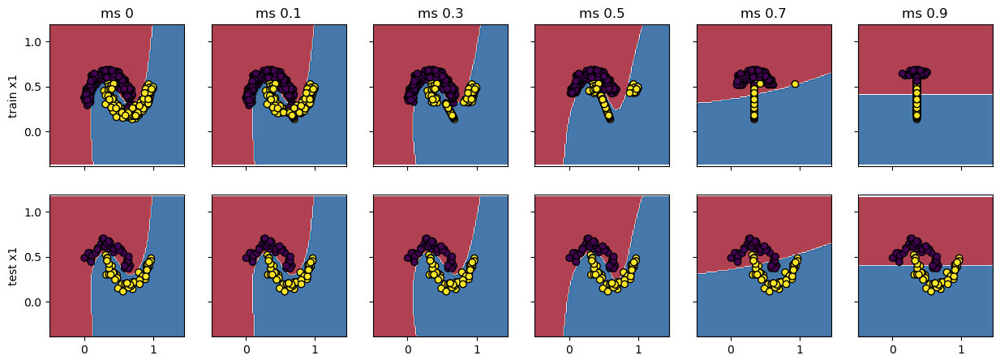

In [210]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='left', cols = [0]
)

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 0.97
MR: 0.5 Accuracy: 0.95
MR: 0.7 Accuracy: 0.79
MR: 0.9 Accuracy: 0.44


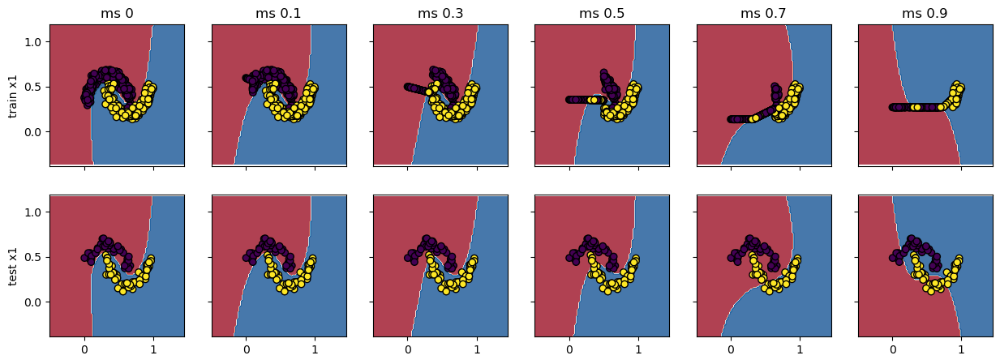

In [211]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='left', cols = [1]
)

### MARY

MR: 0 Accuracy: 0.98
MR: 0.1 Accuracy: 0.98
MR: 0.3 Accuracy: 0.74
MR: 0.5 Accuracy: 0.78
MR: 0.7 Accuracy: 0.49
MR: 0.9 Accuracy: 0.53


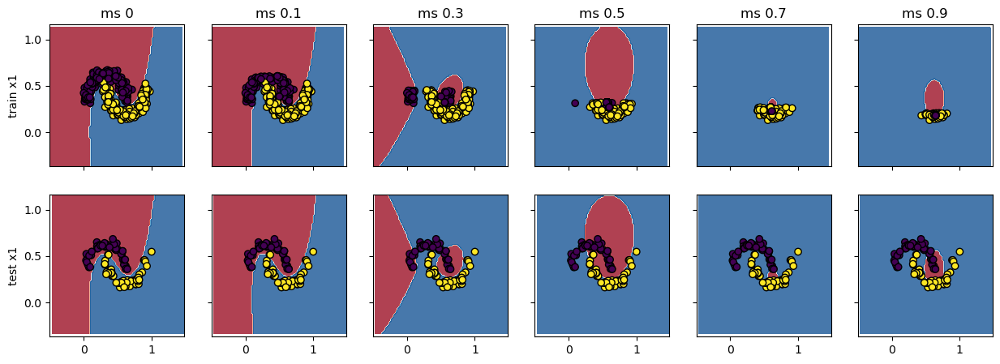

In [248]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='right'
)

MR: 0 Accuracy: 0.98
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 0.72
MR: 0.5 Accuracy: 0.54
MR: 0.7 Accuracy: 0.48
MR: 0.9 Accuracy: 0.41


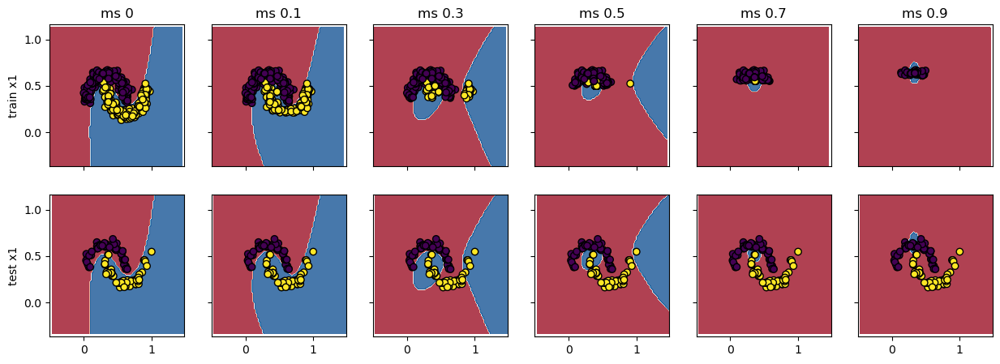

In [249]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='left'
)

## Moon 2

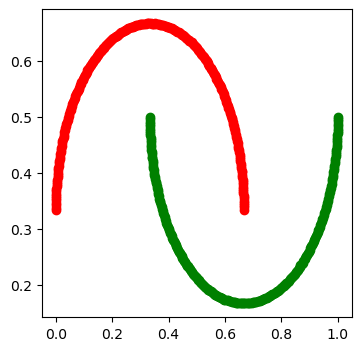

(400, 2) (400,) (100, 2) (100,)


In [281]:
X, y = make_moons(n_samples=500, shuffle=True, noise=0.001, random_state=None)
X = (X - X.min())/(X.max() - X.min())
data = np.concatenate((X, y.reshape(-1, 1)), axis=1)
data = pd.DataFrame(data)
red = y == 0
green = y == 1
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(X[red, 0], X[red, 1], c="r")
ax.scatter(X[green, 0], X[green, 1], c="g")
plt.axis("tight")
plt.show()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 1.0
MR: 0.3 Accuracy: 1.0
MR: 0.5 Accuracy: 0.91
MR: 0.7 Accuracy: 0.77
MR: 0.9 Accuracy: 0.88


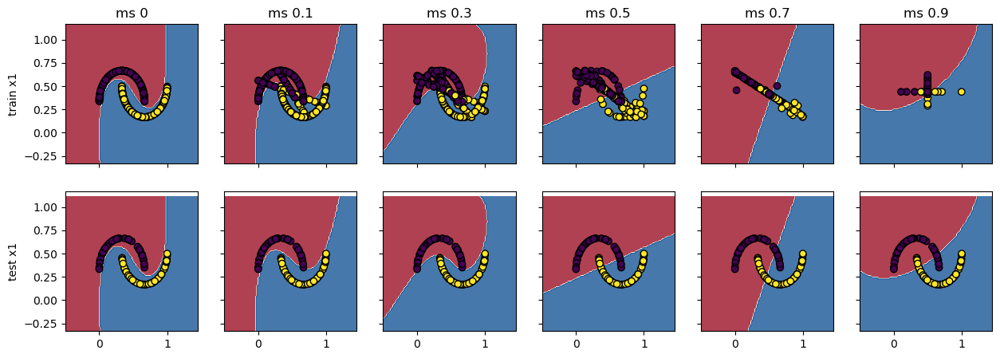

In [282]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'iterative', 42
)

MR: 0 Accuracy: 1.0
MR: 0.1 Accuracy: 0.95
MR: 0.3 Accuracy: 0.94
MR: 0.5 Accuracy: 0.98
MR: 0.7 Accuracy: 0.79
MR: 0.9 Accuracy: 0.71


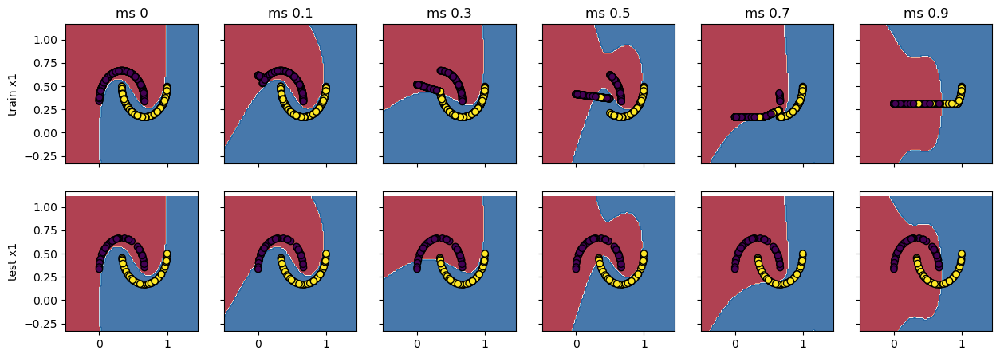

In [283]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 'iterative', 42, 
    ms_func = 'left', cols = [1]
)

## Hyperbolic

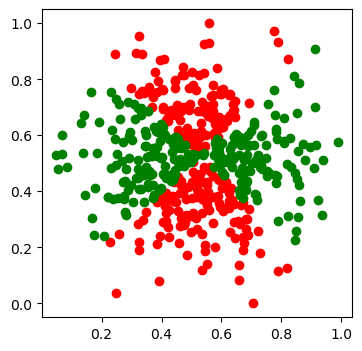

(400, 2) (400,) (100, 2) (100,)


In [250]:
def gen_ellipse(n_samples, random_state=0):
    np.random.seed(random_state)
    x1 = np.random.normal(0, 1, n_samples)
    x2 = np.random.normal(0, 1, n_samples)
    y = x1**2 - x2**2
    X = np.array([x1, x2]).T
    y = np.where(y > 0, 1, 0)

    return X, y

X, y = gen_ellipse(500)
X = (X - X.min())/(X.max() - X.min())
red = y == 0
green = y == 1
fig, ax = plt.subplots(figsize=(4, 4))
ax.scatter(X[red, 0], X[red, 1], c="r")
ax.scatter(X[green, 0], X[green, 1], c="g")
plt.axis("tight")
plt.show()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

### MCAR

MR: 0 Accuracy: 0.55
MR: 0.1 Accuracy: 0.55
MR: 0.3 Accuracy: 0.62
MR: 0.5 Accuracy: 0.46
MR: 0.7 Accuracy: 0.57
MR: 0.9 Accuracy: 0.57


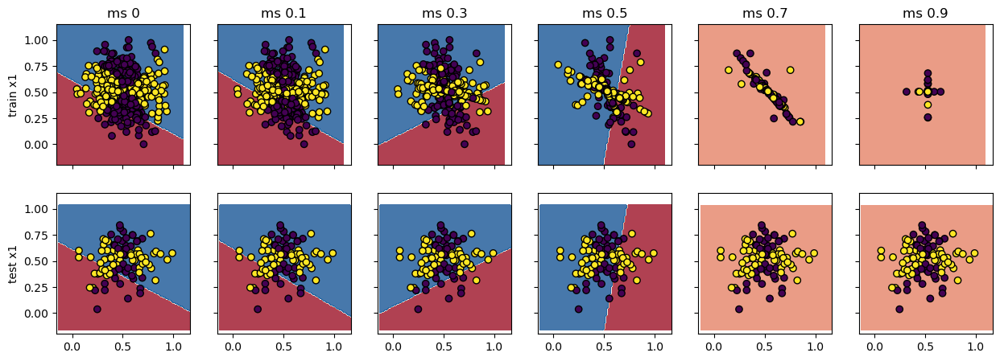

In [153]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mcar', 'iterative', 42, eps = 0.2
)

MR: 0 Accuracy: 0.96
MR: 0.1 Accuracy: 0.94
MR: 0.3 Accuracy: 0.86
MR: 0.5 Accuracy: 0.74
MR: 0.7 Accuracy: 0.71
MR: 0.9 Accuracy: 0.55


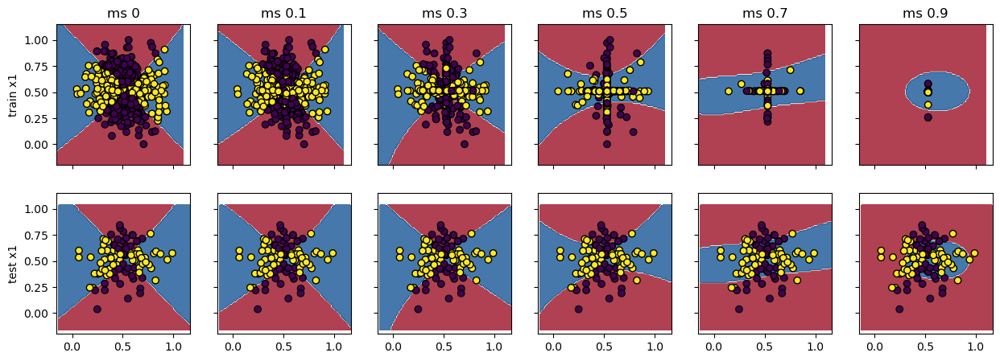

In [154]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'simple', 42, eps = 0.2
)

MR: 0 Accuracy: 0.96
MR: 0.1 Accuracy: 0.94
MR: 0.3 Accuracy: 0.87
MR: 0.5 Accuracy: 0.78
MR: 0.7 Accuracy: 0.69
MR: 0.9 Accuracy: 0.44


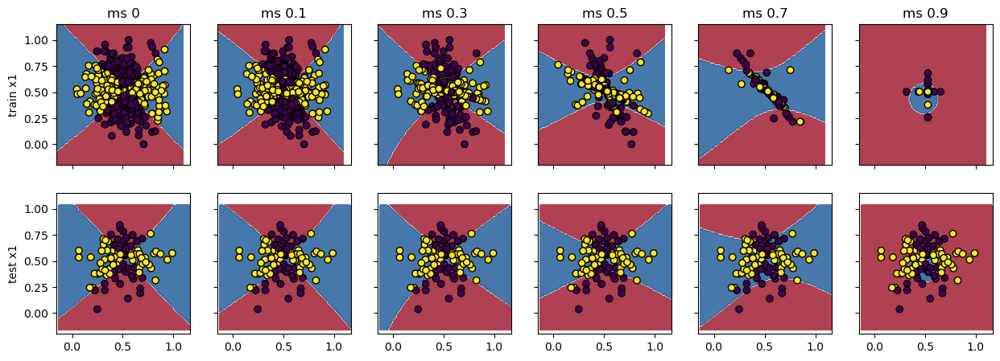

In [155]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'iterative', 42, eps = 0.2
)

### MAR

MR: 0 Accuracy: 0.96
MR: 0.1 Accuracy: 0.95
MR: 0.3 Accuracy: 0.86
MR: 0.5 Accuracy: 0.83
MR: 0.7 Accuracy: 0.78
MR: 0.9 Accuracy: 0.58


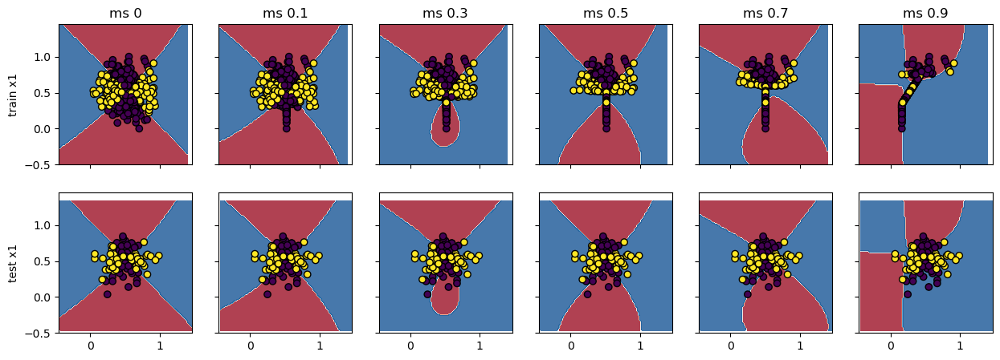

In [213]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='left', cols = [0]
)

MR: 0 Accuracy: 0.96
MR: 0.1 Accuracy: 0.88
MR: 0.3 Accuracy: 0.74
MR: 0.5 Accuracy: 0.73
MR: 0.7 Accuracy: 0.85
MR: 0.9 Accuracy: 0.74


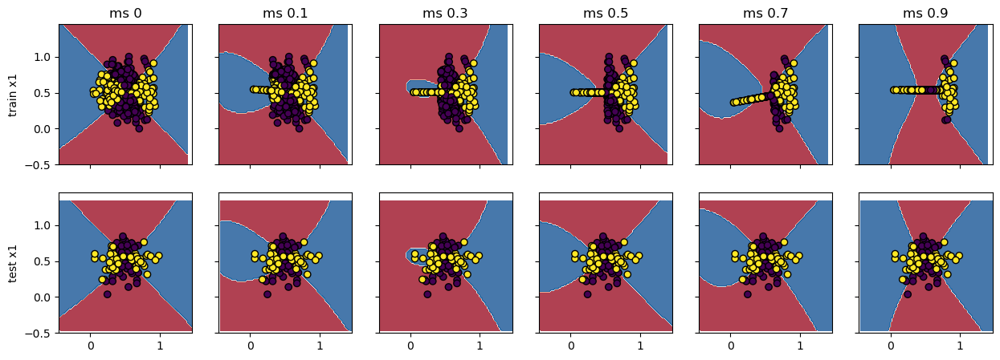

In [214]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='left', cols = [1]
)

### MARY

MR: 0 Accuracy: 0.96
MR: 0.1 Accuracy: 0.97
MR: 0.3 Accuracy: 0.76
MR: 0.5 Accuracy: 0.65
MR: 0.7 Accuracy: 0.63
MR: 0.9 Accuracy: 0.41


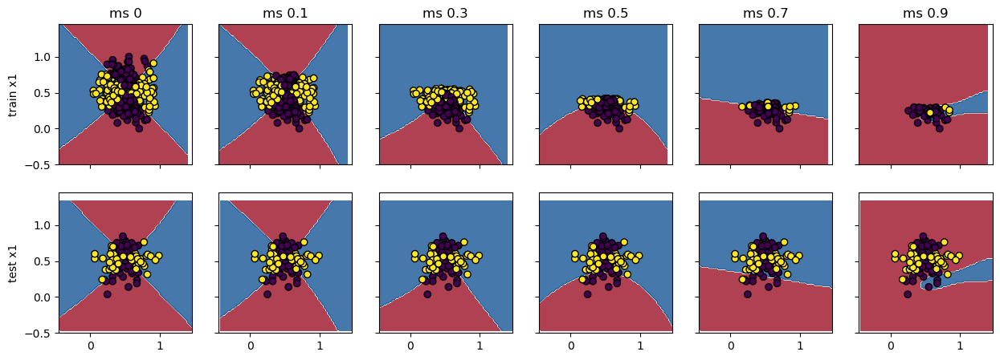

In [251]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='right'
)

MR: 0 Accuracy: 0.96
MR: 0.1 Accuracy: 0.95
MR: 0.3 Accuracy: 0.88
MR: 0.5 Accuracy: 0.49
MR: 0.7 Accuracy: 0.6
MR: 0.9 Accuracy: 0.41


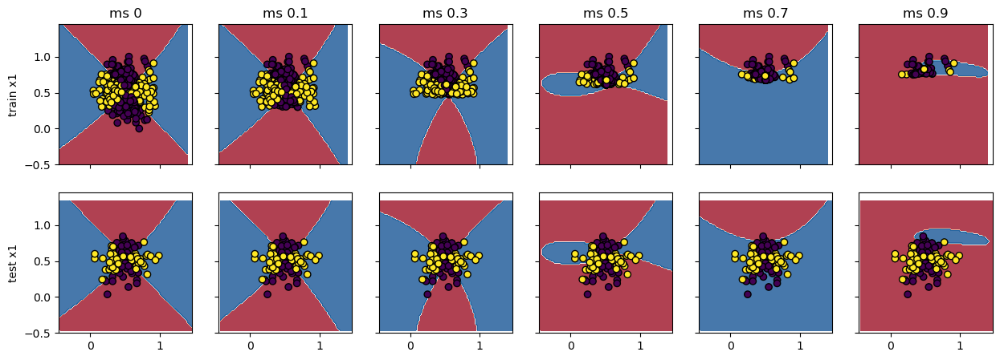

In [252]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='left'
)

## Breast Cancer

In [253]:
data, config = load_data("breast")
print(data.shape)
print(config)
train_test_sets = split_train_test(data, n_folds = 5, seed = 45)
print(len(train_test_sets))
train_data, test_data = train_test_sets[0]
print(train_data.shape, test_data.shape)
features = ['area_mean', 'concavity_mean']
target = config['target']

train_data = train_data[features + [target]]
test_data = test_data[features + [target]]
print(train_data.shape, test_data.shape)
X_train, y_train = train_data[features].values, train_data[target].values
X_test, y_test = test_data[features].values, test_data[target].values
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(569, 17)
{'target': 'diagnosis', 'important_features_idx': [1, 3, 13, 7, 12, 14, 0, 2, 4, 15], 'features_idx': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], 'num_cols': 16, 'task_type': 'classification', 'clf_type': 'binary-class', 'data_type': 'tabular'}
5
(455, 17) (114, 17)
(455, 3) (114, 3)
(455, 2) (455,) (114, 2) (114,)


### MCAR

MR: 0 Accuracy: 0.9122807017543859
MR: 0.1 Accuracy: 0.9035087719298246
MR: 0.3 Accuracy: 0.9210526315789473
MR: 0.5 Accuracy: 0.9122807017543859
MR: 0.7 Accuracy: 0.9122807017543859
MR: 0.9 Accuracy: 0.9210526315789473


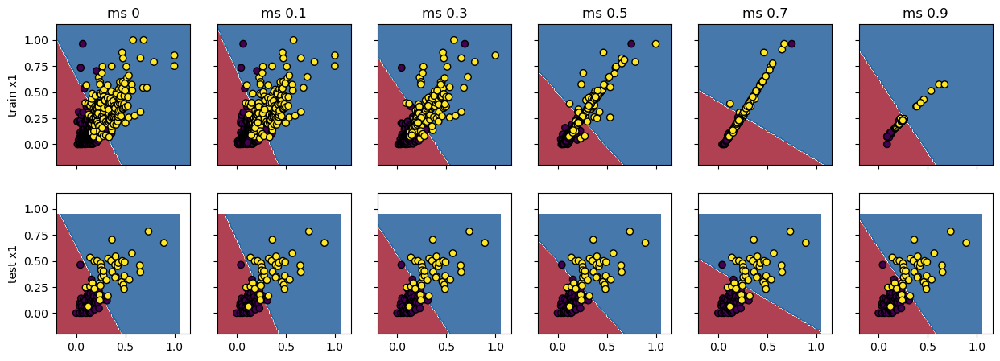

In [217]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mcar', 'iterative', 109, eps = 0.2
)

MR: 0 Accuracy: 0.9035087719298246
MR: 0.1 Accuracy: 0.9122807017543859
MR: 0.3 Accuracy: 0.9122807017543859
MR: 0.5 Accuracy: 0.8771929824561403
MR: 0.7 Accuracy: 0.8596491228070176
MR: 0.9 Accuracy: 0.8771929824561403


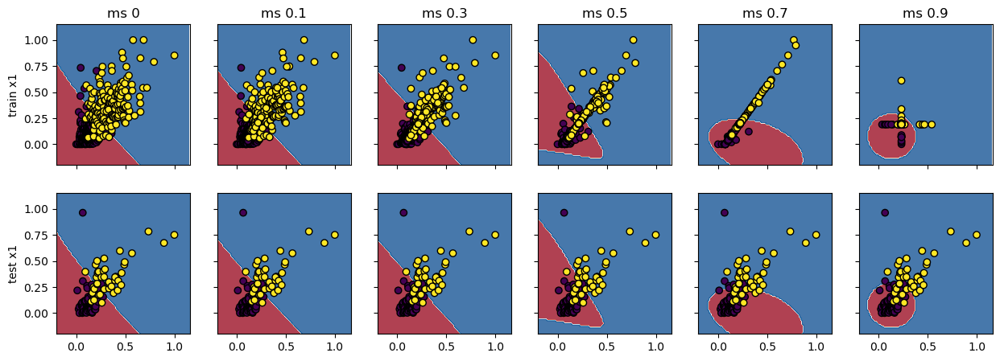

In [168]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mcar', 'iterative', 42, eps = 0.2
)

### MAR

MR: 0 Accuracy: 0.9298245614035088
MR: 0.1 Accuracy: 0.9298245614035088
MR: 0.3 Accuracy: 0.9210526315789473
MR: 0.5 Accuracy: 0.9035087719298246
MR: 0.7 Accuracy: 0.9035087719298246
MR: 0.9 Accuracy: 0.8333333333333334


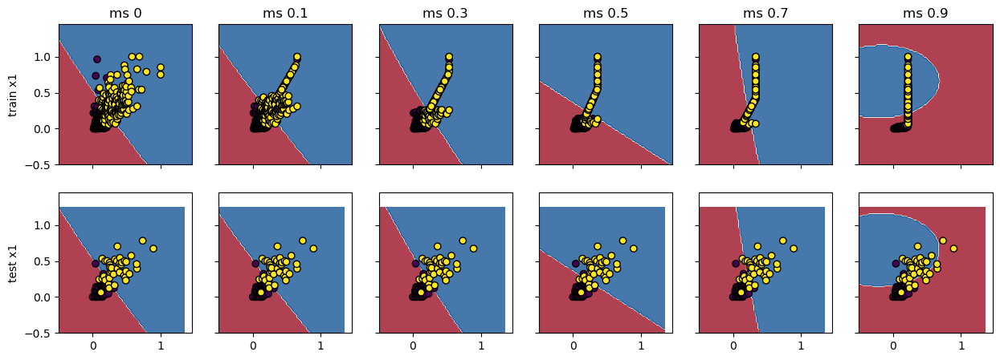

In [221]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='right', cols = [0]
)

MR: 0 Accuracy: 0.9298245614035088
MR: 0.1 Accuracy: 0.9298245614035088
MR: 0.3 Accuracy: 0.868421052631579
MR: 0.5 Accuracy: 0.8859649122807017
MR: 0.7 Accuracy: 0.8859649122807017
MR: 0.9 Accuracy: 0.8333333333333334


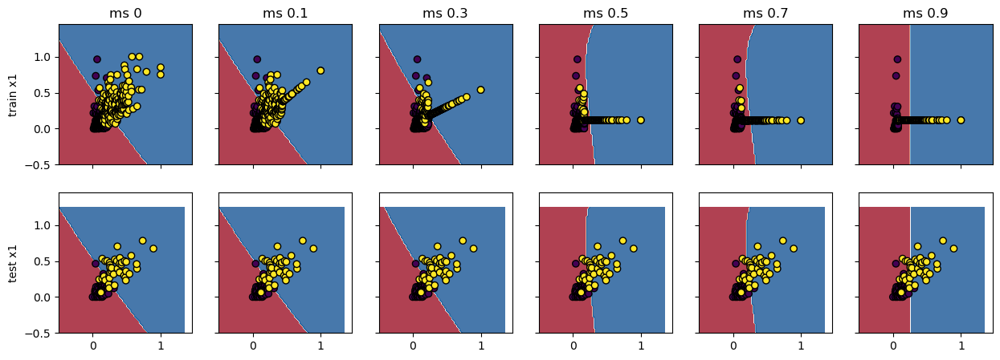

In [223]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'svm', 'mar_quantile_strict', 
    'iterative', 456, ms_func ='right', cols = [1]
)

### MARY

MR: 0 Accuracy: 0.9122807017543859
MR: 0.1 Accuracy: 0.8947368421052632
MR: 0.3 Accuracy: 0.8245614035087719
MR: 0.5 Accuracy: 0.631578947368421
MR: 0.7 Accuracy: 0.631578947368421
MR: 0.9 Accuracy: 0.631578947368421


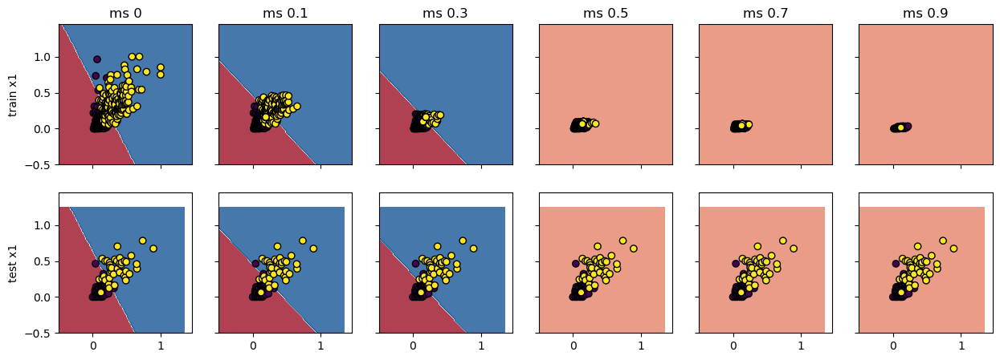

In [256]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='right'
)

MR: 0 Accuracy: 0.9122807017543859
MR: 0.1 Accuracy: 0.9385964912280702
MR: 0.3 Accuracy: 0.8859649122807017
MR: 0.5 Accuracy: 0.8070175438596491
MR: 0.7 Accuracy: 0.7105263157894737
MR: 0.9 Accuracy: 0.7280701754385965


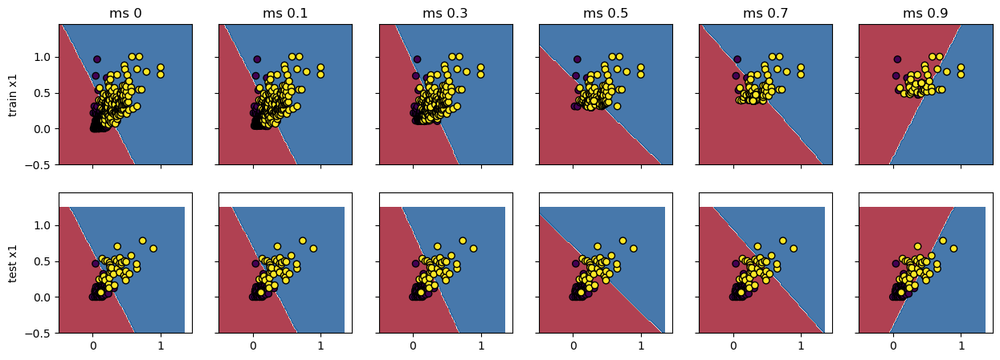

In [257]:
datas, clfs = calculate_2d_mapping(
    X_train, y_train, X_test, y_test, [0, 0.1, 0.3, 0.5, 0.7, 0.9], 'logistic', 'mary_quantile_strict', 
    'iterative', 456, ms_func ='left'
)